## Load libraries

In [1]:
import yt
import caesar
import numpy as np
import matplotlib.pyplot as plt
import unyt
import json
import pprint
import copy

import os
from glob import glob
from pathlib import Path

# For Swift Emulator training and validation
import swiftemulator as se
from swiftemulator.design import latin
from swiftemulator.io.swift import load_parameter_files
from swiftemulator.emulators import gaussian_process, gaussian_process_bins, gaussian_process_mcmc, gaussian_process_one_dim, linear_model, multi_gaussian_process
from swiftemulator.mean_models.polynomial import PolynomialMeanModel
from swiftemulator.sensitivity import basic, cross_check, cross_check_bins
from swiftemulator.mocking import mock_sweep

# For reading in and checking observational data
import swiftpipeline as sp

from velociraptor.observations import load_observation, load_observations
from swiftemulator.comparison.penalty import L2PenaltyCalculator, GaussianDataErrorsPercentFloorPenaltyCalculator
from swiftemulator.comparison.visualisation import visualise_penalties_mean, visualise_penalties_generic_statistic


# For fitting model to data
from scipy.optimize import minimize

import emcee
import corner
import arviz
from scipy.stats import norm

/home/b/babul/aspadawe/miniconda3/envs/yt_swift_caesar/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load simulated data (galaxy functions, scaling relations, ...)

In [269]:
snap_prefix = 'model-name'  # eg. 'simba_s12.5n128'
snap_num = 'snapshot-number'  # eg. '0015'
snap_dir = '/path/to/calibration/directory'
obs_name = 'name-of-observable'  # eg. 'gsmf'

In [17]:
cali_dirs = [Path(x) for x in glob(os.path.join(snap_dir,'cali_*'))]
cali_dirnames = {dirname.stem: dirname for dirname in cali_dirs}
cali_list = [dirname.stem for dirname in cali_dirs]

In [18]:
sim_dict = {}

for cali in cali_list:
    sim_file = os.path.join(snap_dir, cali, snap_prefix+'_'+obs_name+'_'+snap_num+'.hdf5')

    # Load simulation observable data, eg. GSMF
    sim_data = vel_sim_data = load_observations(sim_file)[0]
    logM = np.log10(sim_data.x.value)
    logPhi = np.log10(sim_data.y.value)
    Phi_err = sim_data.y_scatter.value
    logPhi_err = Phi_err/(np.log(10) * 10**logPhi)
    
    # Sanitize data of -inf, +inf, NaN values
    # Data for different simulations may have different array lengths
    isfinite = np.isfinite(logPhi)
    logM = logM[isfinite]
    logPhi = logPhi[isfinite]
    Phi_err = Phi_err[isfinite]
    logPhi_err = logPhi_err[isfinite]
    
    sim_dict[cali] = {'logM':logM, 'logPhi':logPhi, 'Phi_err':Phi_err, 'logPhi_err':logPhi_err}

/tmp/ipykernel_243975/1829679864.py:9: RuntimeWarning: divide by zero encountered in log10
  logPhi = np.log10(sim_data.y.value)
/tmp/ipykernel_243975/1829679864.py:11: RuntimeWarning: invalid value encountered in divide
  logPhi_err = Phi_err/(np.log(10) * 10**logPhi)


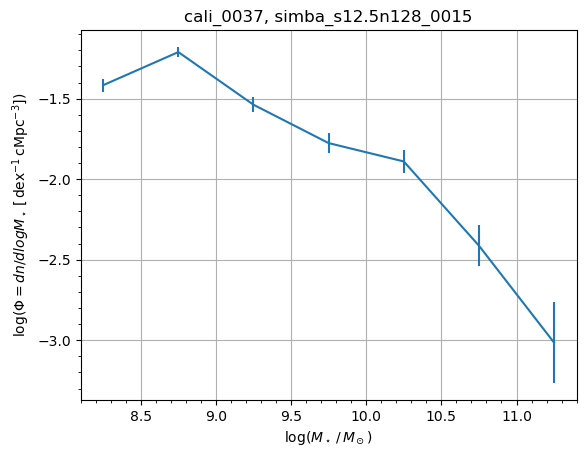

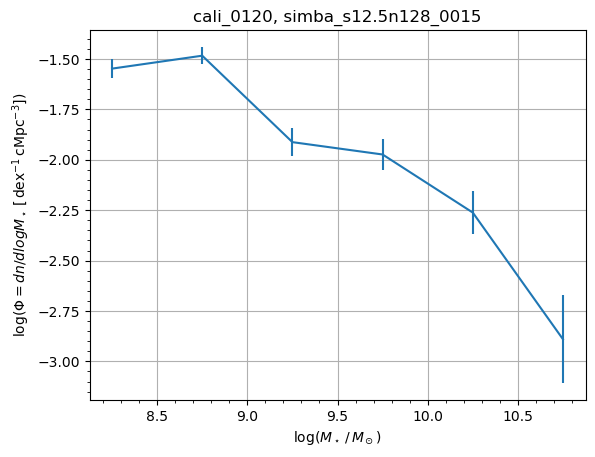

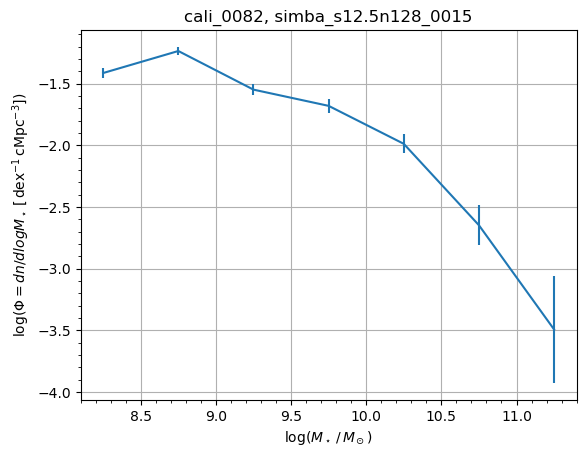

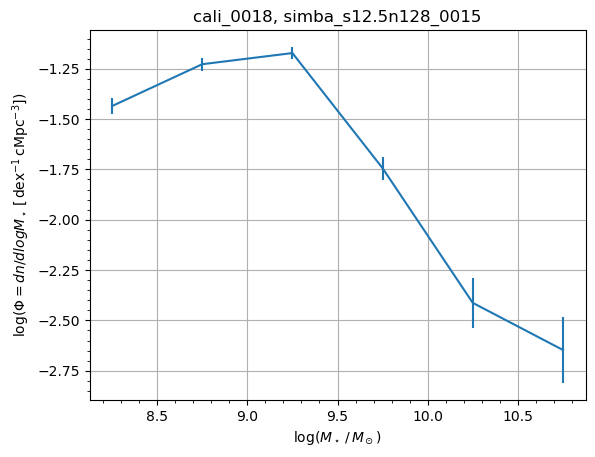

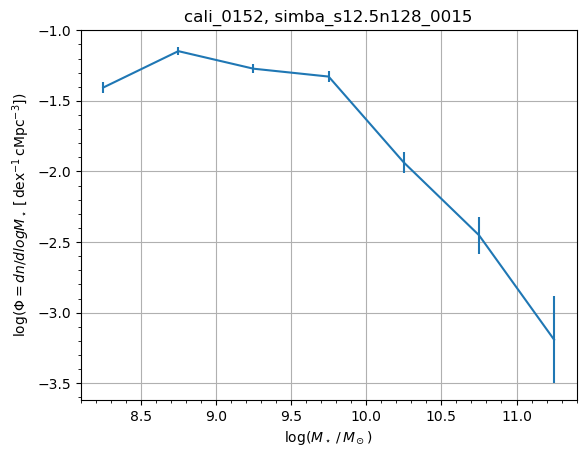

...

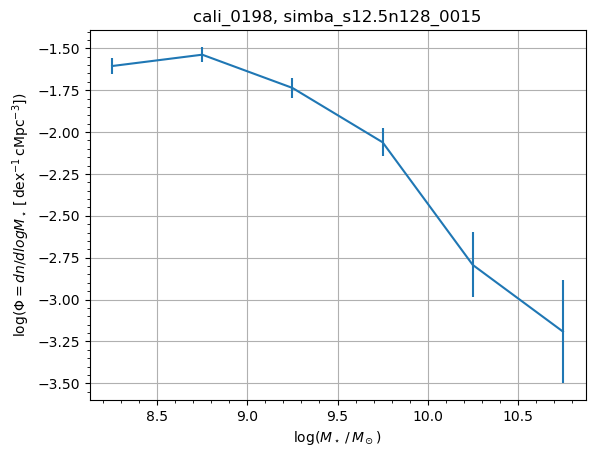

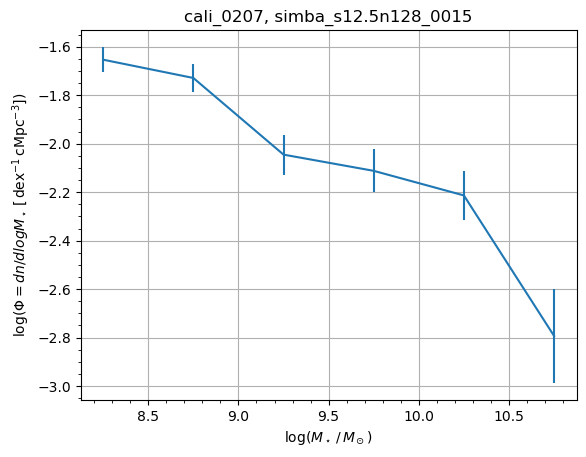

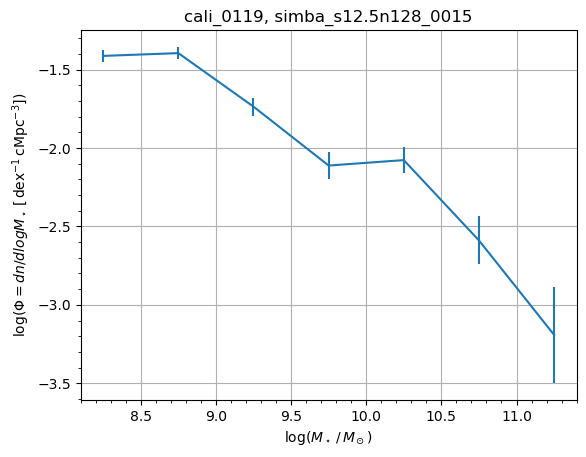

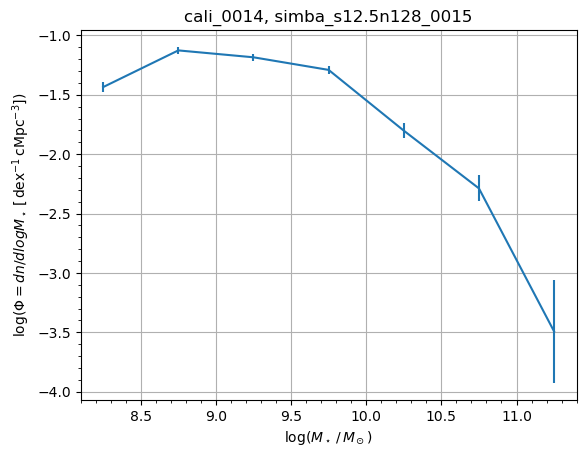

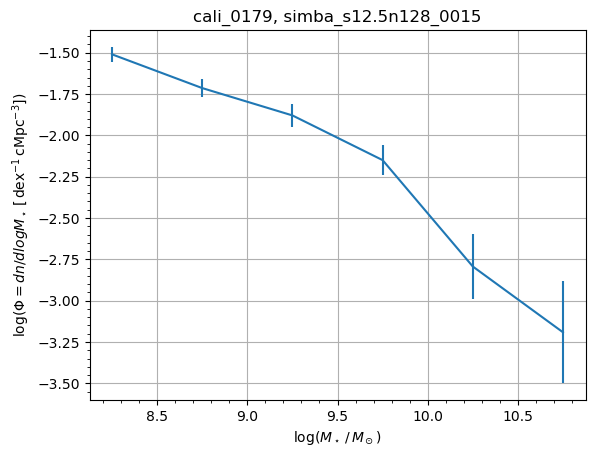

In [10]:
# Plot the GSMFs to check it worked

for cali in sim_dict:
    plt.clf()
    plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
    plt.ylabel(r'$\log(\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')
    plt.title(r'%s, %s_%s' % (cali, snap_prefix, snap_num))
    plt.grid()
    plt.minorticks_on()
    plt.errorbar(sim_dict[cali]['logM'], sim_dict[cali]['logPhi'], yerr=sim_dict[cali]['logPhi_err'], ls='-')
    plt.show()

## Specify the model parameters and values

In [19]:
parameter_files = [Path(x) for x in glob(os.path.join(snap_dir, 'original_ymls', '*.yml'))]
parameter_filenames = {filename.stem: filename for filename in parameter_files}

In [20]:
# Doug's BH/AGN model
'''
model_specification, model_parameters = load_parameter_files(
    filenames=parameter_filenames,
    parameters=[
        "SIMBAAGN:xray_f_gas_limit",
        "SIMBAAGN:f_accretion",
        "SIMBAAGN:torque_accretion_norm",
        "SIMBAAGN:wind_momentum_flux"
    ],
    log_parameters=[
    ],
    parameter_printable_names=[
        "$f_{\\rm gas,xray}$",
        "$f_{\\rm acc}$",
        "$\epsilon_{\\rm torque}$",
        "Momentum flux"
    ],
)
'''

# swimba calibration

model_specification, model_parameters = load_parameter_files(
    filenames=parameter_filenames,
    parameters=[
        "SIMBAFeedback:FIRE_velocity_normalization",
        "SIMBAFeedback:FIRE_eta_normalization",
        "SIMBAAGN:torque_accretion_norm",
        "SIMBAAGN:jet_mass_min_Msun",
    ],
    log_parameters=[
        "SIMBAAGN:jet_mass_min_Msun",
    ],
    parameter_printable_names=[
        "$v_{a}$",
        "$\\eta_{0}$",
        "$\\varepsilon_{\\rm torque}$",
        "$\\log_{10}$ $M_{\\rm BH, lim}/M_{\\rm \odot}$",
    ],
)


# swimba calibration
'''
model_specification, model_parameters = load_parameter_files(
    filenames=parameter_filenames,
    parameters=[
        "SIMBAFeedback:FIRE_velocity_normalization",
        "SIMBAAGN:torque_accretion_norm",
    ],
    parameter_printable_names=[
        "$v_{a}$",
        "$\\varepsilon_{\\rm torque}$",
    ],
)
'''

In [21]:
modelvalues = {}
for unique_identifier in model_parameters.model_parameters:
    cali = "cali_%04d" % int(unique_identifier)

    independent = sim_dict[cali]['logM']
    dependent = sim_dict[cali]['logPhi']
    dependent_error = sim_dict[cali]['logPhi_err']
    
    modelvalues[unique_identifier] = {"independent": independent,
                                    "dependent": dependent,
                                    "dependent_error": dependent_error}

model_values = se.ModelValues(model_values=modelvalues)

## Train emulator

In [22]:
gsmf_emulator = gaussian_process.GaussianProcessEmulator()  # Default
#gsmf_emulator = gaussian_process_mcmc.GaussianProcessEmulatorMCMC()  # With MCMC
#gsmf_emulator = gaussian_process_bins.GaussianProcessEmulatorBins()  # Gaussian Process Emulator using an emulator for each bins
#gsmf_emulator = gaussian_process_one_dim.GaussianProcessEmulator1D()  # Gaussian Process Emulator for emulating single values
#gsmf_emulator = linear_model.LinearModelEmulator(lasso_model_alpha=0)  # Linear Model Emulator
#gsmf_emulator = multi_gaussian_process.MultipleGaussianProcessEmulator()  # A gaussian process emulator that uses _multiple_ internal emulators to better predict functions that contain a ‘break’.
#polynomial_model = PolynomialMeanModel(degree=2)  # Polynomial mean model
#gsmf_emulator = gaussian_process.GaussianProcessEmulator(mean_model=polynomial_model)  # Mean model

gsmf_emulator.fit_model(model_specification=model_specification,
                            model_parameters=model_parameters,
                            model_values=model_values)

## Make predictions and compare

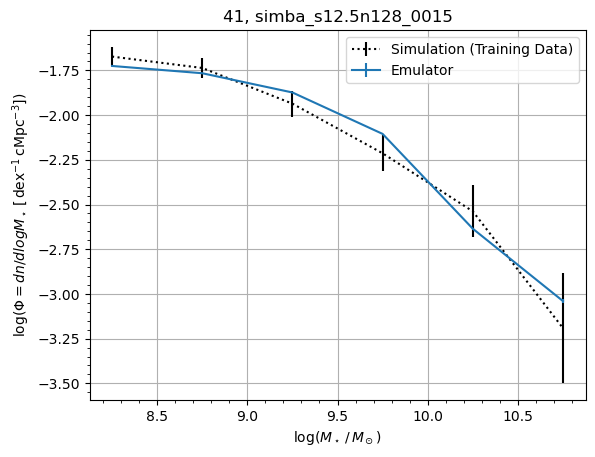

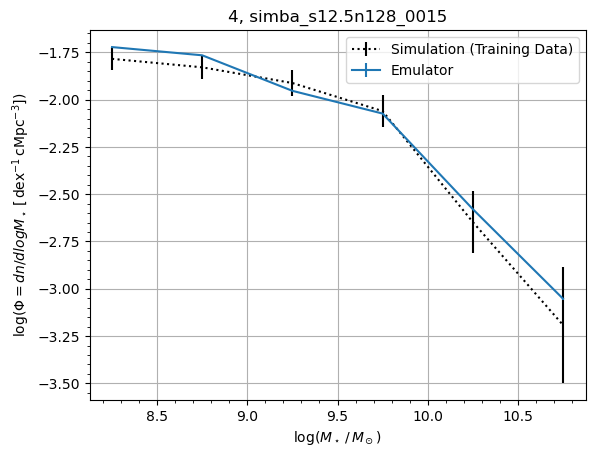

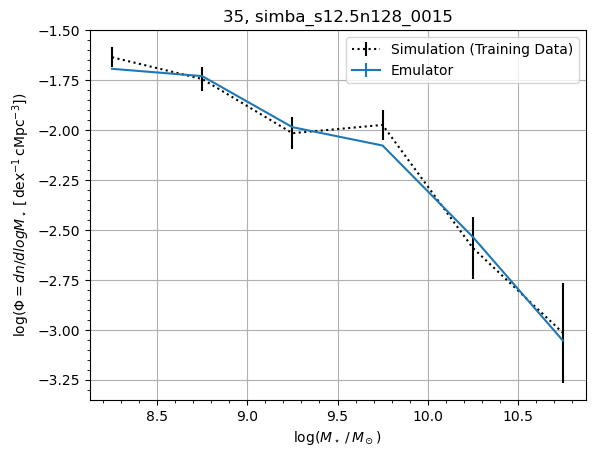

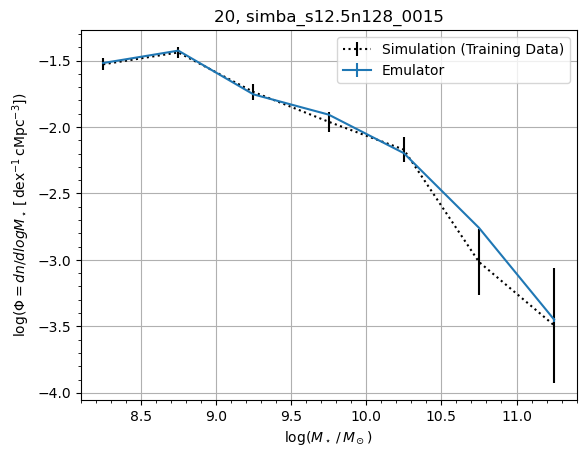

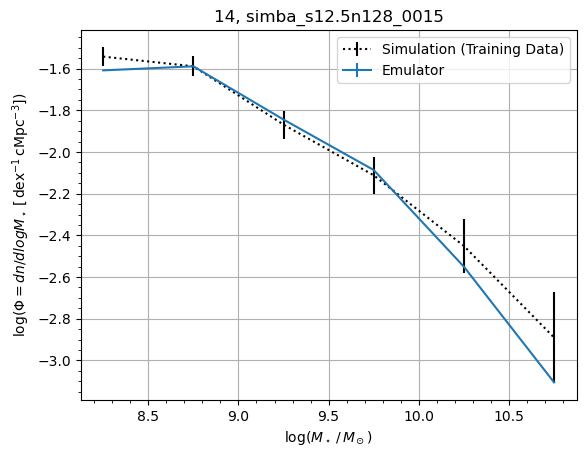

...

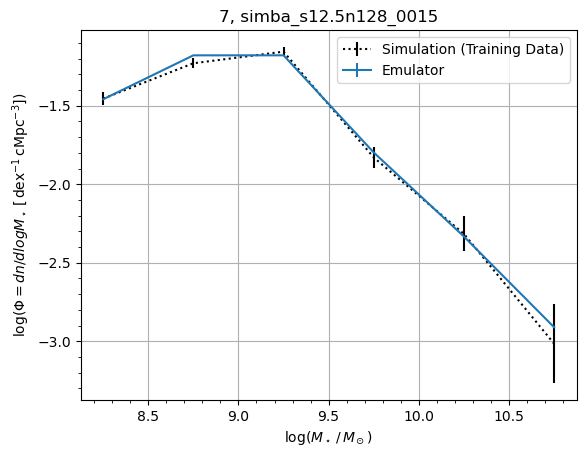

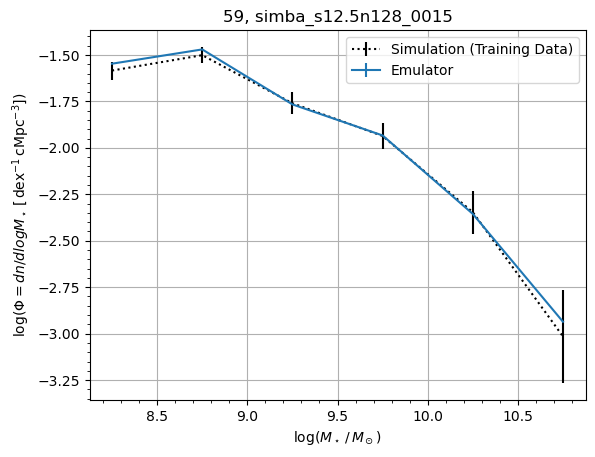

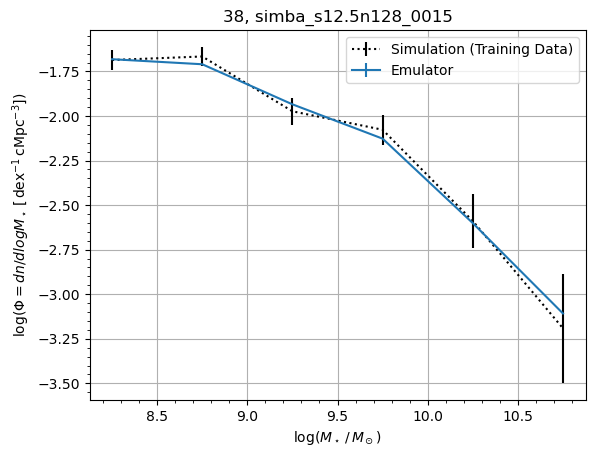

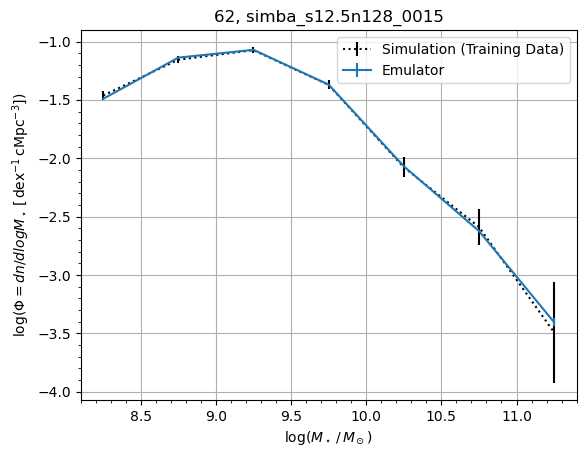

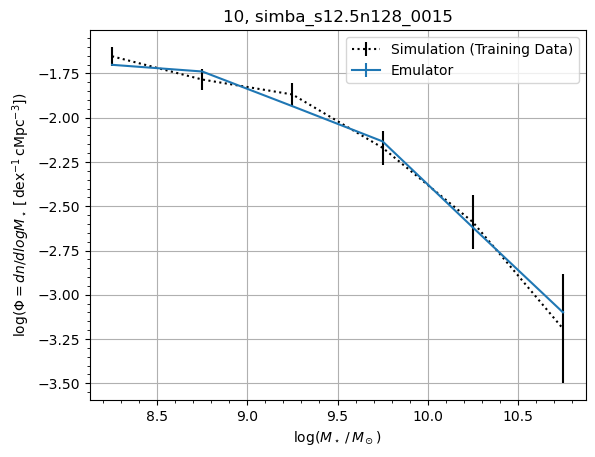

In [23]:
# Make predictions with trained emulator to compare to input

for cali in gsmf_emulator.model_parameters.model_parameters:
    pred_params = gsmf_emulator.model_parameters[cali]
    pred_x = gsmf_emulator.model_values[cali]['independent']
    sim_y = gsmf_emulator.model_values[cali]['dependent']
    sim_yerr = gsmf_emulator.model_values[cali]['dependent_error']

    pred_y, pred_var = gsmf_emulator.predict_values(pred_x, pred_params)

    plt.clf()
    plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
    plt.ylabel(r'$\log (\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')
    plt.title(r'%s, %s_%s' % (cali, snap_prefix, snap_num))
    plt.grid()
    plt.minorticks_on()
    plt.errorbar(pred_x, sim_y, yerr=sim_yerr, color="black", ls=":", label="Simulation (Training Data)")
    plt.errorbar(pred_x, pred_y, yerr=pred_var, ls='-', label='Emulator')
    plt.legend()
    plt.show()

## Parameter sensitivity analysis

In [24]:
gsmf_sensitivities = basic.binwise_sensitivity(specification=model_specification,
                                             parameters=model_parameters,
                                             values=model_values)
list(gsmf_sensitivities.values())

[array([0.7978493 , 0.26404402]),
 array([0.97991307, 0.20857947]),
 array([0.94806887, 0.06636501]),
 array([0.82265248, 0.34162946]),
 array([0.53939103, 0.66842407]),
 array([0.33272301, 0.67612026]),
 array([0.52062077, 0.82177396])]

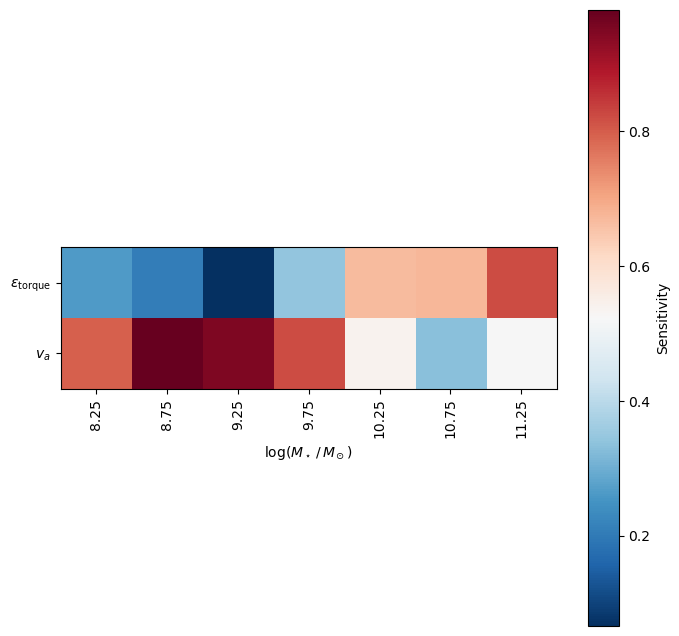

In [25]:
fig, ax = basic.plot_binwise_sensitivity(specification=model_specification,
                                         sensitivities=gsmf_sensitivities,
                                         xlabel=r'$\log(M_\star\,/\,M_\odot)$',
                                         cbarlabel='Sensitivity',
                                         vmin=np.min(list(gsmf_sensitivities.values())),
                                         vmax=np.max(list(gsmf_sensitivities.values())))

fig.set_size_inches(8, 8, forward=True)

## Perform cross check (validation)

In [26]:
gsmf_ccheck = cross_check.CrossCheck(hide_progress=False)
gsmf_ccheck.build_emulators(model_specification=model_specification,
                        model_parameters=model_parameters,
                        model_values=model_values)

100%|██████████| 63/63 [00:31<00:00,  2.02it/s]


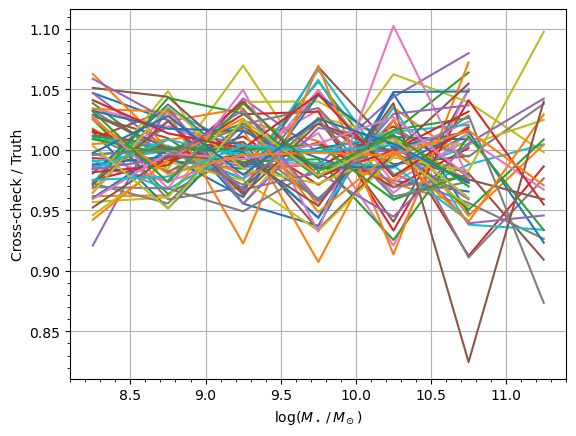

In [27]:
data_by_cc = gsmf_ccheck.build_mocked_model_values_original_independent()

for unique_identifier in gsmf_ccheck.model_values.model_values:
    cc_over_og = data_by_cc[unique_identifier]["dependent"] / \
                model_values[unique_identifier]["dependent"]
#    cc_minus_og_over_og = (data_by_cc[unique_identifier]["dependent"] / \
#                           model_values[unique_identifier]["dependent"])/ model_values[unique_identifier]["dependent"]
    plt.plot(data_by_cc[unique_identifier]["independent"], cc_over_og)

plt.grid()
plt.minorticks_on()
plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
plt.ylabel("Cross-check / Truth")
plt.show()

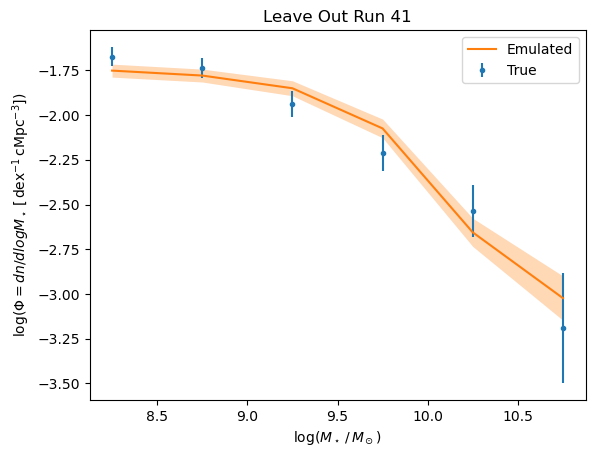

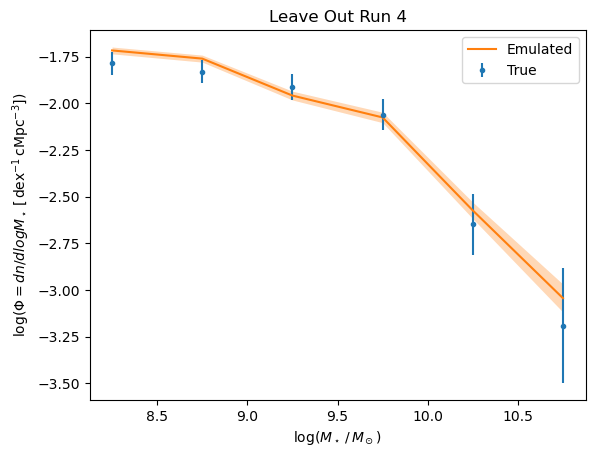

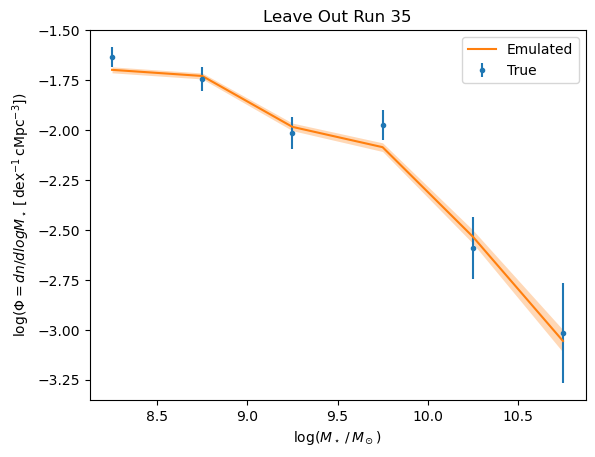

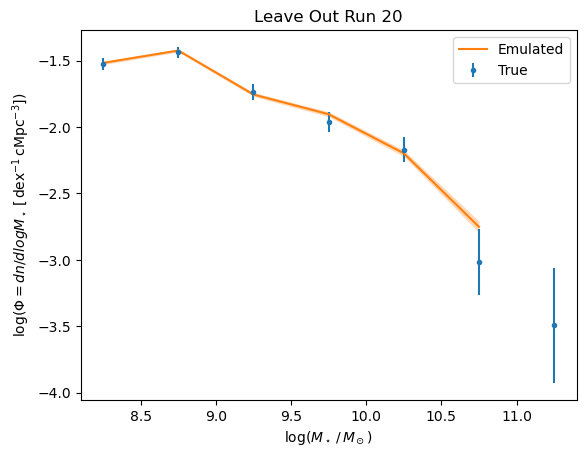

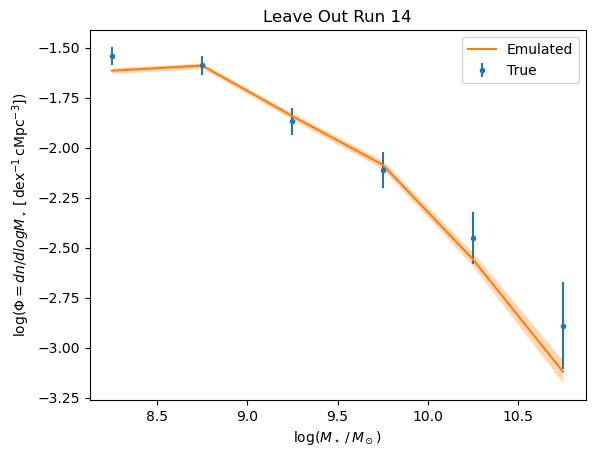

...

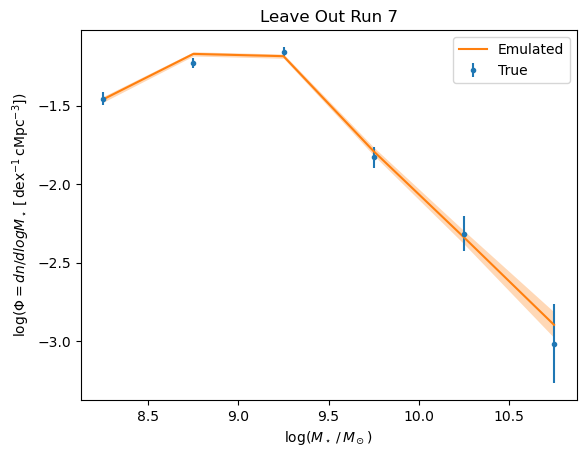

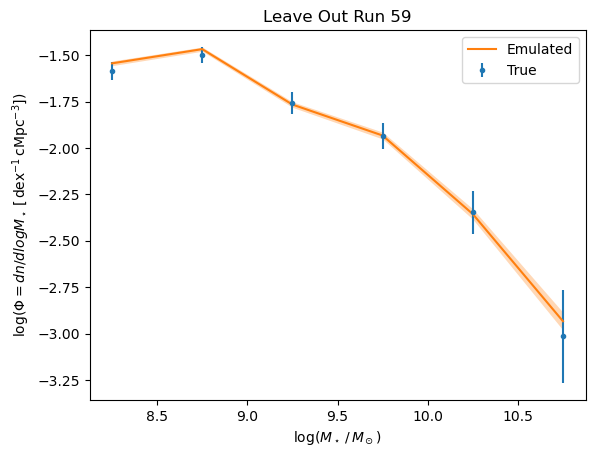

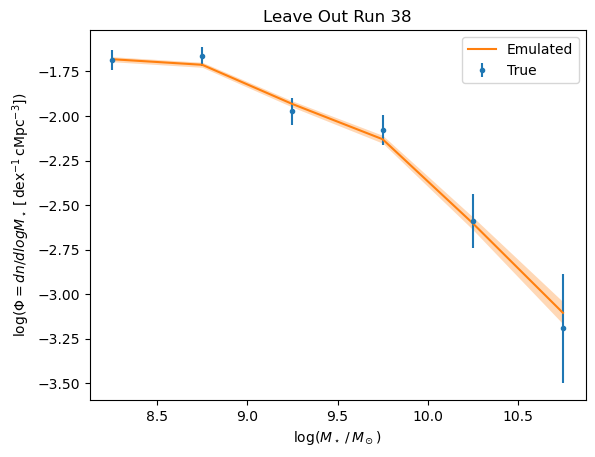

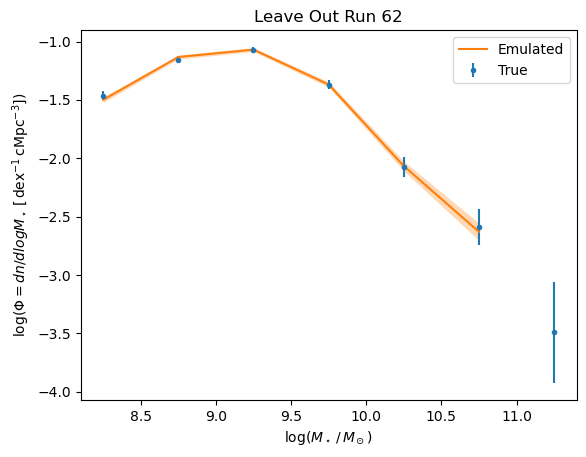

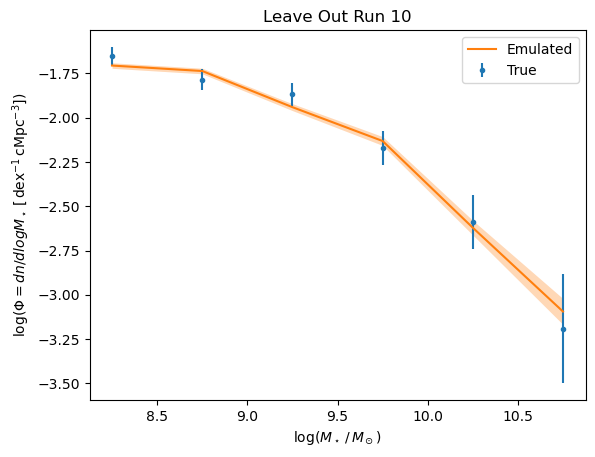

In [28]:
gsmf_ccheck.plot_results(emulate_at=data_by_cc[unique_identifier]["independent"],
                         xlabel=r'$\log(M_\star\,/\,M_\odot)$',
                         ylabel=r'$\log (\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')

In [29]:
total_mean_squared = gsmf_ccheck.get_mean_squared()[0]
print("Total mean squared of entire set of left-out simulations: %s" % total_mean_squared)

Total mean squared of entire set of left-out simulations: 0.007572417152157673


## Model Parameter Features

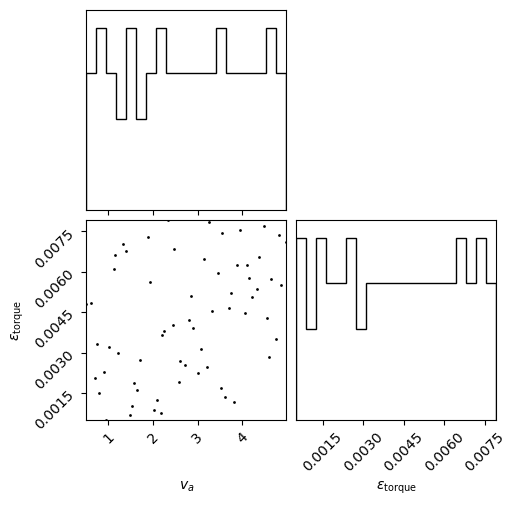

In [30]:
model_parameters.plot_model(model_specification)

## Sweeps of parameter space

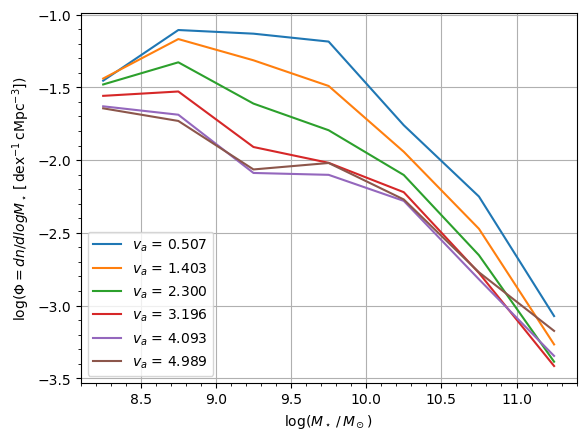

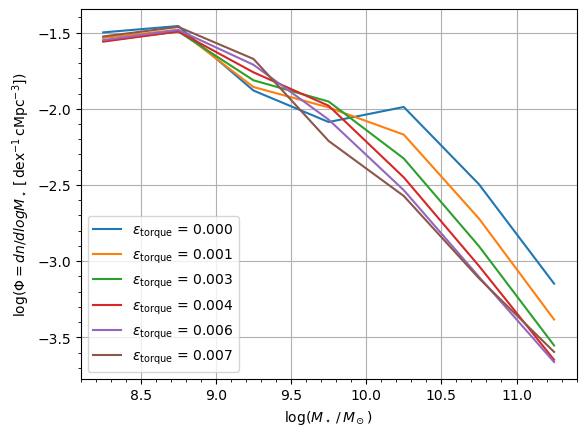

In [31]:
# Arbitrarily choose initial parameters to sweep from
# Doesn't matter too much though, because it ends up covering
# roughly the entire range of parameters used

center = gsmf_emulator.model_parameters['0']

param_printable_names = []
for ii in range(len(gsmf_emulator.parameter_order)):
    param_name = gsmf_emulator.parameter_order[ii]
    param_printable_name = gsmf_emulator.model_specification.parameter_printable_names[ii]
    param_printable_names.append(param_printable_name)
    
    Mock_values, Mock_parameters = mock_sweep(gsmf_emulator, model_specification, 6, param_name,center)

    plt.clf()
    
    for mock_name in Mock_values.keys():
        plt.plot(Mock_values[mock_name]["independent"],
                Mock_values[mock_name]["dependent"],
                label = "%s = " % param_printable_name +str(Mock_parameters[mock_name][param_name])[:5])
    
    plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
    plt.ylabel(r'$\log (\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')
    plt.grid()
    plt.minorticks_on()
    plt.legend()
    plt.show()

## Checking hyperparameters (doesn't always work)

In [33]:
gsmf_emulator_mcmc = gaussian_process_mcmc.GaussianProcessEmulatorMCMC(burn_in_steps=1, mcmc_steps=100)#, hide_progress=False)
gsmf_emulator_mcmc.fit_model(model_specification=model_specification,
                        model_parameters=model_parameters,
                        model_values=model_values)

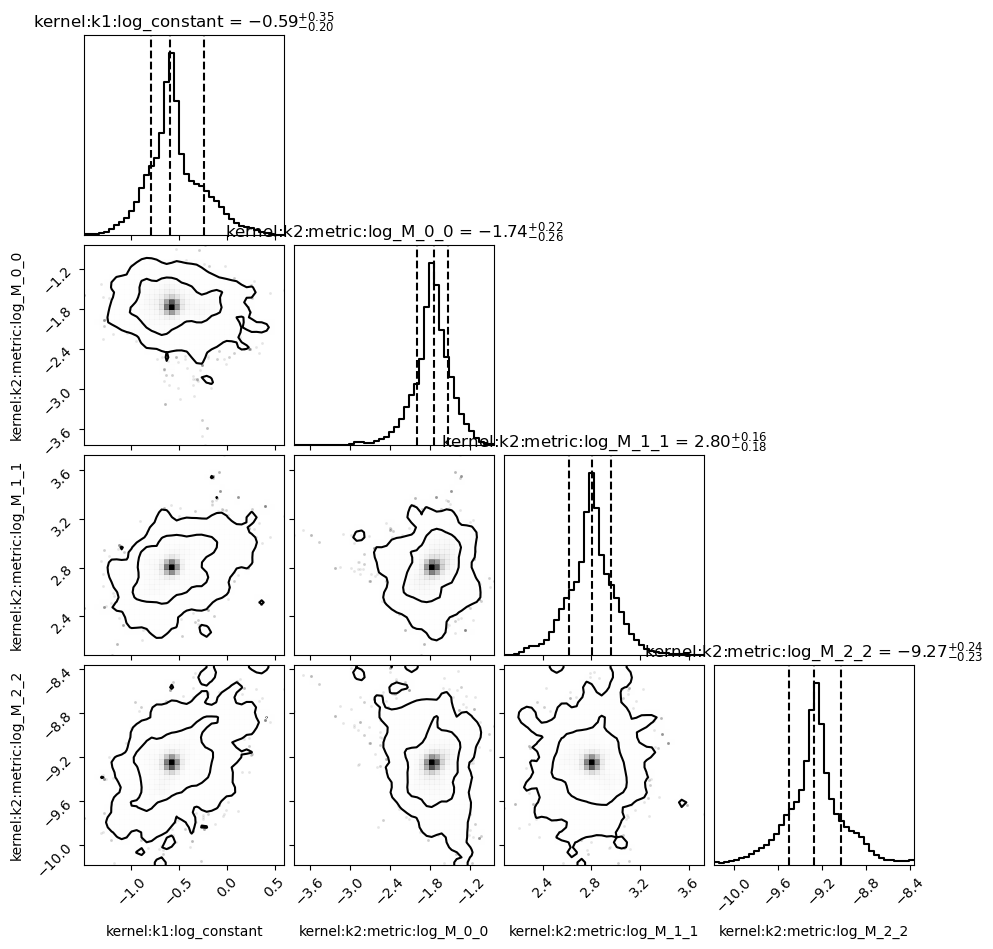

In [34]:
gsmf_emulator_mcmc.plot_hyperparameter_distribution()

# Compare with observational data

## Load observational data

In [35]:
observation = load_observations(
    "/home/b/babul/aspadawe/data/gsmf/Baldry12_gsmf.hdf5"
)[0]
print(observation.cosmology)

FlatLambdaCDM(name="Flat $\Lambda$CDM", H0=70.0 km / (Mpc s), Om0=0.3, Tcmb0=0.0 K, Neff=3.04, m_nu=None, Ob0=0.0)


## Penalty function

In [36]:
#penalty_calculator = L2PenaltyCalculator(offset = 0.5, lower=min(np.log10(observation.x)),upper=max(np.log10(observation.x))+1)
penalty_calculator = GaussianDataErrorsPercentFloorPenaltyCalculator(percent_error=20,
                                                                     sigma_max=3,
                                                                     lower=min(np.log10(observation.x)),
                                                                     upper=max(np.log10(observation.x))+1)

penalty_calculator.register_observation(observation,
                                log_independent=True,
                                log_dependent=True,
                                independent_units=unyt.Msun,
                                dependent_units=unyt.Mpc**(-3))

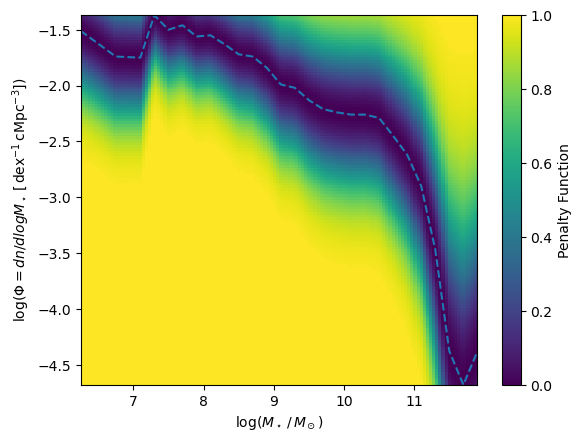

In [37]:
penalty_calculator.plot_penalty(min(np.log10(observation.x)),max(np.log10(observation.x)),
                        min(np.log10(observation.y)),max(np.log10(observation.y)),
                        "penalty_example",
                        x_label=r'$\log(M_\star\,/\,M_\odot)$',
                        y_label=r'$\log (\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$',
                        resolution=128)

In [38]:
# Separate out data into x, y, yerr
# Get only data that corresponds to chosen x range of simulation
# (Need to use GaussianDataErrorsPercentFloorPenaltyCalculator to do this)

x = []
for cali in gsmf_emulator.model_values.model_values:
    x_curr = gsmf_emulator.model_values[cali]['independent']
    if len(x_curr) > len(x):
        x = x_curr

# Using the penalty calculator's internal interpolator produces logged data
# so long as log_independent and log_dependent are set to True
penalty_calculator.observation_interpolation()
y = penalty_calculator.interpolator_values(x)
yerr = penalty_calculator.error_interpolator_values(x)  # can only use for certain penalty calculators, eg. GaussianDataErrorsPercentFloorPenaltyCalculator

data = (x, y, yerr)

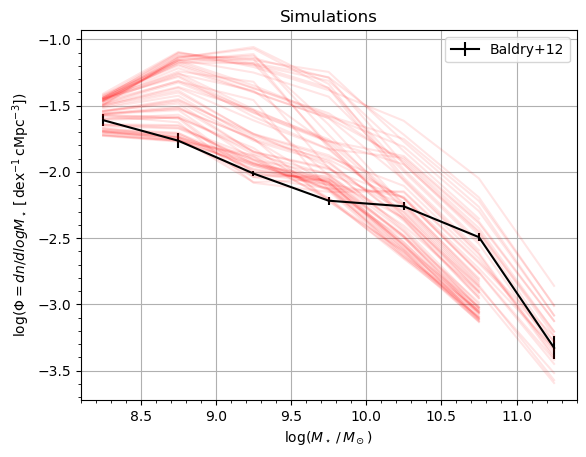

In [39]:
# Plot simulated observations over data

plt.clf()
plt.errorbar(data[0], data[1], yerr=data[2], color="black", ls="-", label="Baldry+12")

for cali in gsmf_emulator.model_parameters.model_parameters:
    pred_params = gsmf_emulator.model_parameters[cali]
    pred_x = gsmf_emulator.model_values[cali]['independent']
    sim_y = gsmf_emulator.model_values[cali]['dependent']

    pred_y, pred_var = gsmf_emulator.predict_values(pred_x, pred_params)

    plt.plot(pred_x, pred_y, color="r", alpha=0.1)

plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
plt.ylabel(r'$\log(\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')
plt.title('Simulations')
plt.grid()
plt.minorticks_on()
plt.legend()
plt.show()

In [40]:
# Check which input simulation best fits the observational data

all_penalties = penalty_calculator.penalties(gsmf_emulator.model_values, np.mean)

all_penalties_array = []
node_number = []
for key in all_penalties.keys():
    all_penalties_array.append(all_penalties[key])
    node_number.append(int(key))

best_node = node_number[np.argmin(all_penalties_array)]

print("Best fit node = ", best_node)

pred_params_best_node = gsmf_emulator.model_parameters[str(best_node)].copy()
print("Parameter values for best fit node:")
print(pred_params_best_node)

Best fit node =  1
Parameter values for best fit node:
{'SIMBAFeedback:FIRE_velocity_normalization': 4.599455083217454, 'SIMBAAGN:torque_accretion_norm': 0.0028525733047826927}


In [41]:
# Check penalty of best fit node
pred_params_best_node = gsmf_emulator.model_parameters[str(best_node)].copy()
x_to_predict = gsmf_emulator.model_values[str(best_node)]['independent']
pred_y, pred_var = gsmf_emulator.predict_values(x_to_predict, pred_params_best_node)

print("Mean Penalty of node %s = %s" % (best_node, np.mean(penalty_calculator.penalty(x_to_predict, pred_y))))

#Let's change one of the parameters and see if it improves the fit
pred_params_change = pred_params_best_node.copy()
pred_params_change["SIMBAFeedback:FIRE_velocity_normalization"] += 0.1
pred_y, pred_var = gsmf_emulator.predict_values(x_to_predict, pred_params_change)

print("Mean after change = %s" % np.mean(penalty_calculator.penalty(x_to_predict, pred_y)))

Mean Penalty of node 1 = 0.0591655599094999
Mean after change = 0.05866972452210031


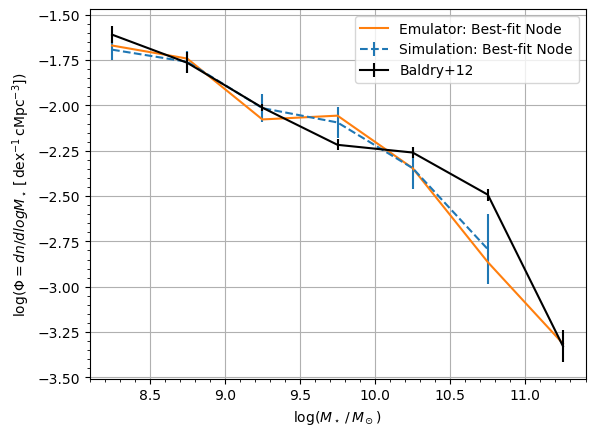

In [42]:
# Plot best fit node and data

#pred_x = np.log10(penalty_calculator.observation.x.value)
pred_x = data[0]
pred_y, pred_var = gsmf_emulator.predict_values(pred_x, pred_params_best_node)

plt.clf()
plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
plt.ylabel(r'$\log(\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')
plt.grid()
plt.minorticks_on()
plt.errorbar(gsmf_emulator.model_values[str(best_node)]['independent'], gsmf_emulator.model_values[str(best_node)]['dependent'], gsmf_emulator.model_values[str(best_node)]['dependent_error'], ls='--', label='Simulation: Best-fit Node')
plt.plot(pred_x, pred_y, ls='-', label='Emulator: Best-fit Node')
plt.errorbar(data[0], data[1], yerr=data[2], color="black", ls="-", label="Baldry+12")
plt.legend()
plt.show()

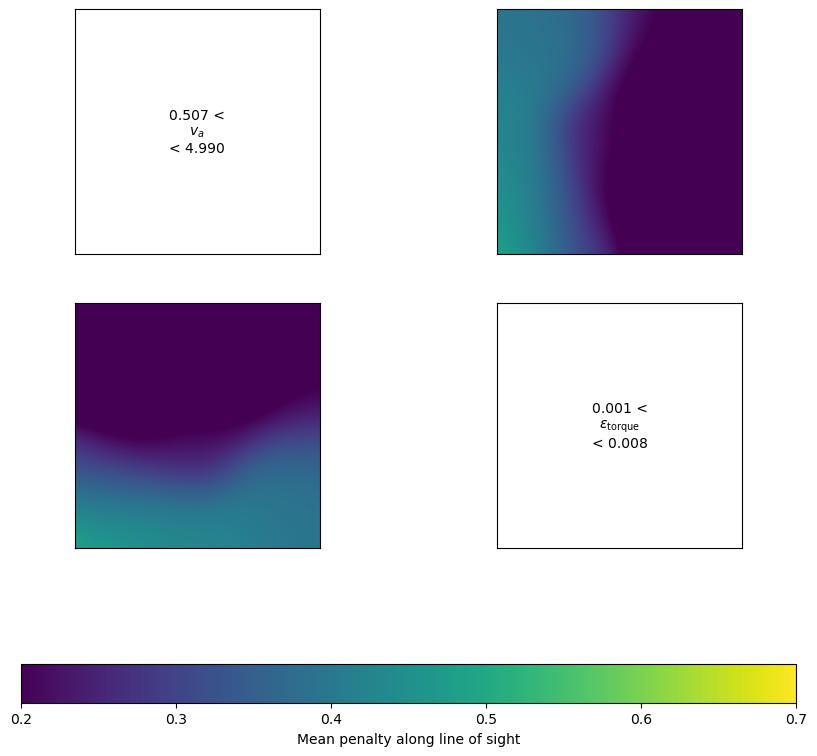

In [43]:
fig, ax = visualise_penalties_mean(gsmf_emulator.model_specification, gsmf_emulator.model_parameters, all_penalties,
                                   remove_ticks=True,
                                   figsize=(10,10),
                                   use_colorbar=True)

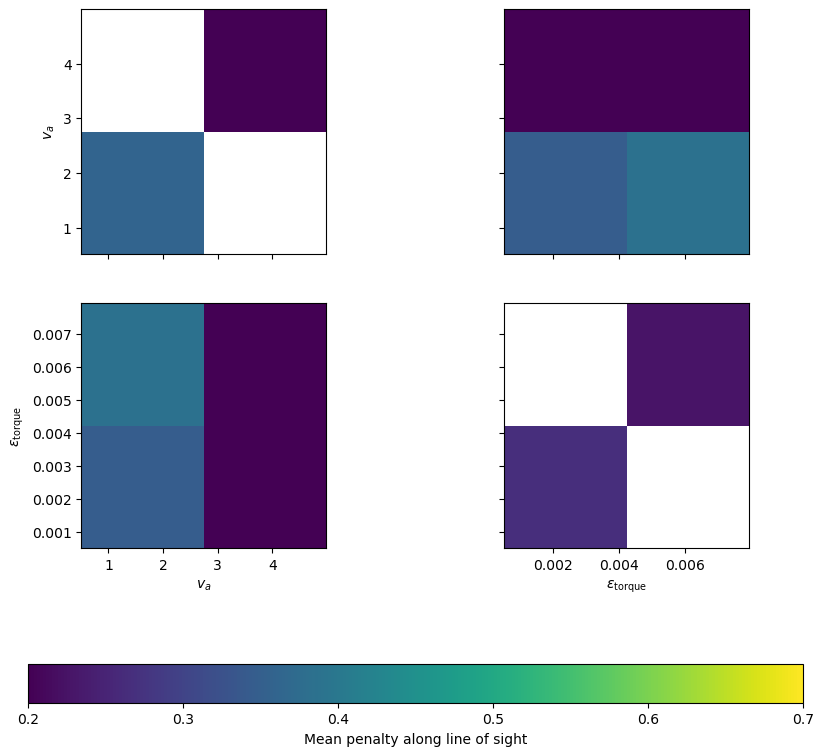

In [44]:
# Statistic options are: mean, std, median, count, sum, min, max, OR user defined function
fig, ax = visualise_penalties_generic_statistic(gsmf_emulator.model_specification, gsmf_emulator.model_parameters, all_penalties,
                                                statistic='mean',
                                                remove_ticks=False,
                                                figsize=(10,10),
                                                use_colorbar=True)

## Fit emulator model to observational data

In [45]:
# Get min and max values of each parameter that go into original simulations
# They will be the MCMC parameter limits

param_mins_arr = np.zeros(len(gsmf_emulator.parameter_order), float)
param_maxs_arr = np.zeros(len(gsmf_emulator.parameter_order), float)
param_values = {}
param_mins = {}
param_maxs = {}
for param in gsmf_emulator.parameter_order:
    idx = gsmf_emulator.parameter_order.index(param)
    param_values[param] = list([])

    for mod, vals in gsmf_emulator.model_parameters.items():
        param_values[param].append(vals[param])
    
    param_mins[param] = min(param_values[param])
    param_maxs[param] = max(param_values[param])
    
    param_mins_arr[idx] = min(param_values[param])
    param_maxs_arr[idx] = max(param_values[param])

In [46]:
def model(theta, x):
    params = gsmf_emulator.model_parameters[str(best_node)].copy()

    for ii in range(len(theta)):
        key = list(params.keys())[ii]
        params[key] = theta[ii]

    val, var = gsmf_emulator.predict_values(x, params)
    return val


def lnlike(theta, x, y, yerr):
    m = model(theta, x=x)
    
#    LnLike = sum(norm.logpdf(y, loc=m, scale=yerr))  # One way to get LnLike with scipy.stats
    LnLike = -0.5 * sum(np.power((y - m)*np.power(yerr,-1), 2))  # Get likelihood (assuming indepenent Gaussian error bars?)
    
#    sigma2 = yerr**2 + m**2
#    LnLike = -0.5 * np.sum((y - m)**2 / sigma2 + np.log(sigma2))  # Likelihood (no assumptions?)
    
#    LnLike = -0.5 * sum(np.power((y - m), 2))  # If no error bars on data
#    LnLike = -np.sum(penalty_calculator.penalty(x, m))  # if want to use L2 penalty (should be using mean? use sum?)
#    LnLike = -np.mean(penalty_calculator.penalty(x, m, dependent_error=yerr))

#    LnLike = -np.sum((y - m)**2 / 0.5**2)
    
    return LnLike


def within_limits(theta):
    result = True
    for ii in range(len(theta)):
        result = result and (param_mins_arr[ii] <= theta[ii] and theta[ii] <= param_maxs_arr[ii])
        
    return result

def lnprior(theta):
    if within_limits(theta):
        return 0.0
    else:
        return -np.inf
    
def lnprob(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, x, y, yerr)  # if lp not -inf, its 0, so this just returns likelihood

In [47]:
# Get initial estimate of parameters from scipy optimizer
np.random.seed(42)
nll = lambda *args: -lnlike(*args)

initial_opt = list(pred_params_best_node.values())
print(initial_opt)
soln = minimize(nll, initial_opt, args=data)
print(soln)

[4.599455083217454, 0.0028525733047826927]
  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 50.26984626560967
        x: [ 4.599e+00  1.149e-03]
      nit: 6
      jac: [ 0.000e+00  3.996e-04]
 hess_inv: [[ 1.000e+00  0.000e+00]
            [ 0.000e+00  2.984e-08]]
     nfev: 189
     njev: 59


In [48]:
# Parameters for MCMC run
initial_mcmc = soln.x
ndim = len(initial_mcmc)
niter = 1000
nwalkers = 32
p0 = [np.array(initial_mcmc) + 1e-7 * np.random.randn(ndim) for i in range(nwalkers)]

In [49]:
# Function for running production iterations of MCMC
def main(p0, nwalkers, niter, ndim, lnprob, data):
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=data)

    print("Running production...")
    pos, prob, state = sampler.run_mcmc(p0, niter, progress=True)
    print("Done")

    return sampler, pos, prob, state

In [50]:
# Execute MCMC
sampler, pos, prob, state = main(p0, nwalkers, niter, ndim, lnprob, data)

Running production...


100%|██████████| 1000/1000 [00:17<00:00, 56.16it/s]

Done


Text(0.5, 0, 'step number')

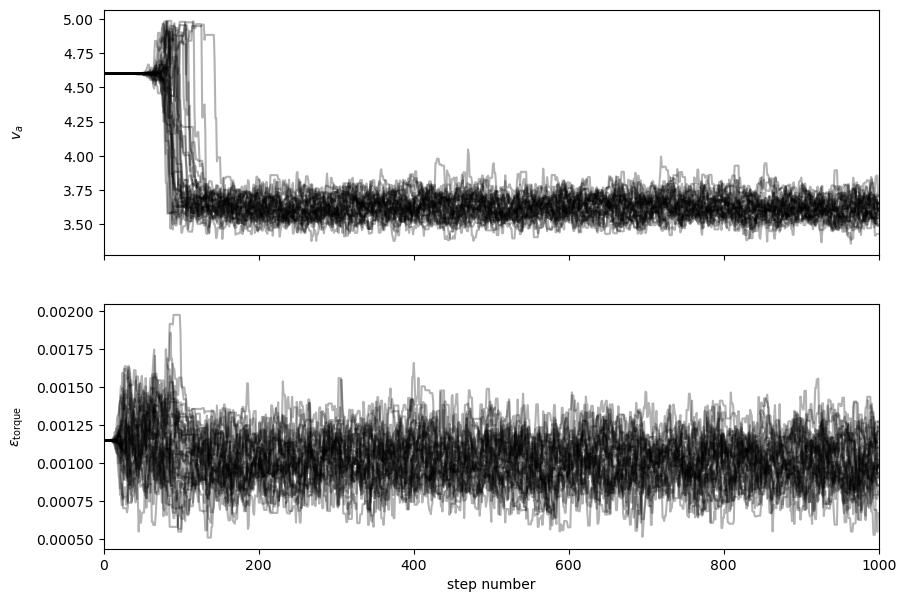

In [51]:
# Plot MCMC chains for each parameter
fig, axes = plt.subplots(ndim, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = param_printable_names
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number")

In [52]:
acc = sampler.acceptance_fraction
print("Mean acceptance fraction = %s" % np.mean(acc))

Mean acceptance fraction = 0.71521875


In [53]:
# Get autocorrelation time to determine burn-in required
tau = sampler.get_autocorr_time(quiet=True)
print(tau)

The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 20;
tau: [79.0179198  25.82436248]


[79.0179198  25.82436248]


In [54]:
# Remove burn-in
nburn = int(np.mean(tau))
multiplier = 6  # discard first multiplier*nburn steps (will need to change multiplier value so that estimate remains conservative)
flat_samples = sampler.get_chain(discard=multiplier*nburn, thin=int(nburn/2), flat=True)

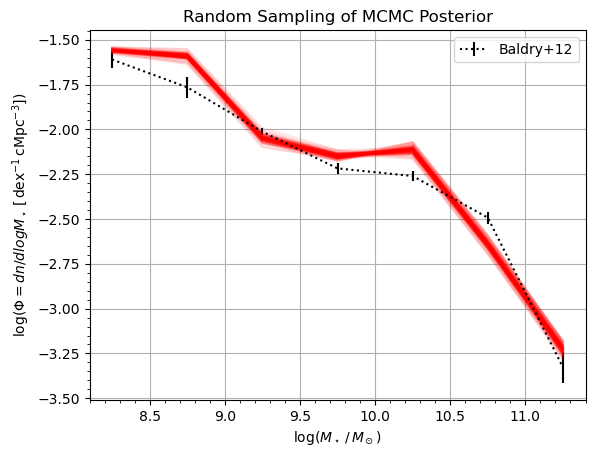

In [55]:
# Extract random sampling of posteriors and plot over data

plt.clf()
plt.errorbar(data[0], data[1], yerr=data[2], color="black", ls=":", label="Baldry+12")

for theta in flat_samples[np.random.randint(len(flat_samples), size=100)]:
    pred_mcmc = model(theta, x=data[0])
    plt.plot(data[0], pred_mcmc, color="r", alpha=0.1)

plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
plt.ylabel(r'$\log(\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')
plt.title('Random Sampling of MCMC Posterior')
plt.grid()
plt.minorticks_on()
plt.legend()
plt.show()

Theta max:  [3.61654605e+00 1.00351251e-03]


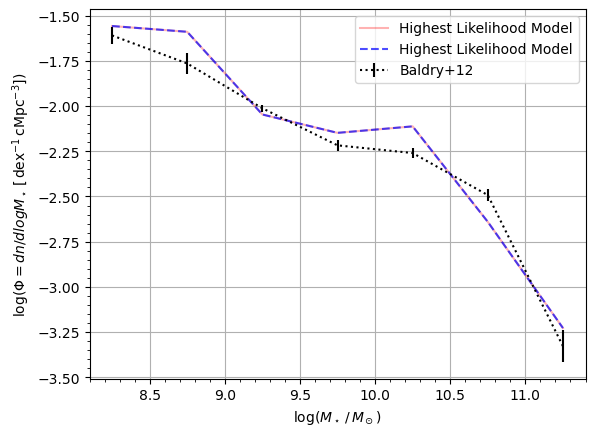

In [56]:
# Posterior parameters with highest probability
theta_max = flat_samples[np.argmax(sampler.get_log_prob(discard=multiplier*nburn, thin=int(nburn/2), flat=True))]
print ('Theta max: ', theta_max)

best_fit_model = model(theta_max, x=data[0])

x_lim = []
for cali in gsmf_emulator.model_values.model_values:
    x_curr = gsmf_emulator.model_values[cali]['independent']
    if len(x_curr) > len(x_lim):
        x_lim = x_curr
best_fit_model_limited = model(theta_max, x=x_lim)

plt.clf()
plt.errorbar(data[0], data[1], yerr=data[2], color="black", ls=":", label="Baldry+12")
plt.plot(data[0], best_fit_model, color="r", alpha=0.3, label='Highest Likelihood Model')
plt.plot(x_lim, best_fit_model_limited, color="blue", ls='--', alpha=0.7, label='Highest Likelihood Model')
plt.xlabel(r'$\log(M_\star\,/\,M_\odot)$')
plt.ylabel(r'$\log(\Phi=dn/dlogM_\star\,[\,\mathrm{dex}^{-1}\,\mathrm{cMpc}^{-3}])$')
plt.grid()
plt.minorticks_on()
plt.legend()
plt.show()

Quantiles:
[(0.16, 3.5468351095598725), (0.5, 3.624107278576051), (0.84, 3.7047135602768293)]
Quantiles:
[(0.16, 0.000870900309252466), (0.5, 0.0010194775284083793), (0.84, 0.0011673726983470445)]


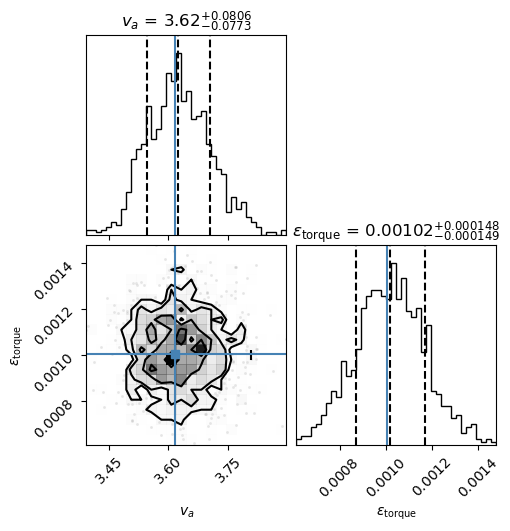

In [57]:
# Corner plot
labels = param_printable_names
fig = corner.corner(flat_samples, bins=20, hist_bin_factor=2, group='posterior', divergences=False, show_titles=True,
                    title_fmt='.3g', labels=labels, plot_datapoints=True, quantiles=[0.16,0.5,0.84],
                    title_quantiles=[0.16,0.5,0.84], smooth=0.2, verbose=True, use_math_text=True, reverse=False, truths=theta_max)